In [1]:
from scipy.io import loadmat, savemat
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

In [15]:
rundata = loadmat('track1_100ms.mat')

In [16]:
spikes = rundata['spikes'][:,np.squeeze(rundata['idx'])]
position = rundata['position'][:,np.squeeze(rundata['idx'])].squeeze()
spikes.shape, position.shape

((117, 2785), (2785,))

In [17]:
del rundata

## Decide included segments

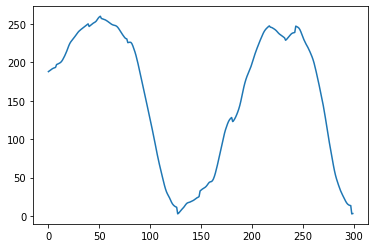

In [13]:
plt.plot(position[500:800])

In [20]:
peaks, _ = find_peaks(position,height=200,distance=50)
peaks = np.append(peaks,len(position)-1)
peaks_r, _ = find_peaks(-position,height=-50,distance=70)

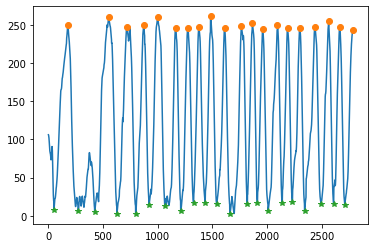

In [21]:
plt.plot(position)
plt.plot(peaks,position[peaks],'o')
plt.plot(peaks_r,position[peaks_r],'*')

In [69]:
# forward
fwd_lst = []
for i in range(3,len(peaks)): # ignore the first few laps b/c maybe unstable
    fwd_lst.append(np.arange(peaks_r[peaks_r<peaks[i]][-1],peaks[i]))

fwd = np.concatenate(fwd_lst)

In [22]:
# backward
fwd_lst = []
for i in range(3,len(peaks_r)): # ignore the first few laps b/c maybe unstable
    fwd_lst.append(np.arange(peaks[peaks<peaks_r[i]][-1],peaks_r[i]))

fwd = np.concatenate(fwd_lst)

In [47]:
# all
fwd = np.arange(500,spikes.shape[1])
fwd_lst = [fwd]

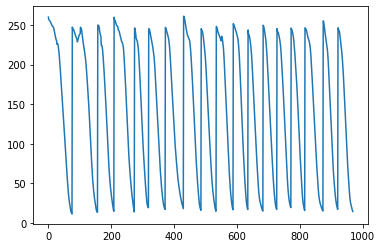

In [23]:
plt.plot(position[fwd])

In [24]:
spikes.shape

(117, 2785)

## Get place cell ids and place fields

In [9]:
def get_place_cell(position,spikes,fwd,n_std=3):
    '''spikes: (#neuron, #sample)'''
    # spatial bins
    pos = np.round(position/position.max()*29)
    pos_list = np.unique(pos)

    # get average tc of segments
    seg_tc = []
    seg_sp = spikes[:,fwd]
    seg_pos = pos[fwd]
    for p in pos_list:
        if seg_pos[seg_pos==p].size>0:
            seg_tc.append((seg_sp[:,seg_pos==p]).mean(axis=1))
        else:
            seg_tc.append(np.zeros(spikes.shape[0]))  
    seg_tc = np.array(seg_tc)
            
    # get place cells
    place_cell = []
    field = []
    for i in range(spikes.shape[0]):
        if seg_tc[:,i].max()>0.3:
            m = seg_tc[:,i].argmax()
            thr = seg_tc[:,i].mean()+n_std*seg_tc[:,i].std()
            if seg_tc[m,i]>thr:
                place_cell.append(i)
                field.append(m)
    field = np.array(field)

    # plot tuning curves of place cells
    order = np.argsort(field)
    plotting = seg_tc[:,place_cell] / seg_tc[:,place_cell].max(axis=0)

    plt.imshow(plotting[:,order])
    plt.xlabel('#cell')
    plt.ylabel('Spatial Bins')
    
    return place_cell, field

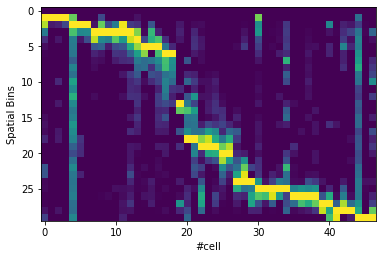

In [38]:
place_cell, field = get_place_cell(position,spikes,fwd,3)

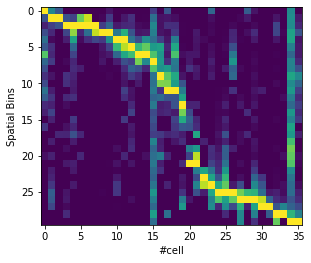

In [10]:
place_cell, field = get_place_cell(position,spikes,fwd,3)

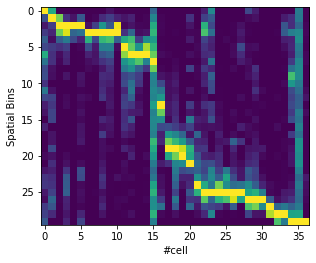

In [54]:
place_cell, field = get_place_cell(position,spikes,fwd)

In [16]:
len(place_cell_fwd), len(place_cell_back)

(36, 47)

In [21]:
place_cell = np.union1d(place_cell_fwd,place_cell_back)
place_cell.shape

(55,)

In [24]:
np.savez('place_cell_fwd.npz',place_cell=place_cell,field=field)

## Cross-Correlation Histogram

In [26]:
def get_delays(place_cell,fwd_lst,spikes,field,r=40):
    DELAYS = []
    pairs_dis = []

    for idx1 in range(len(place_cell)):
        cell1 = place_cell[idx1]
        for idx2 in range(idx1+1,len(place_cell)):
            cell2 = place_cell[idx2]
            delays = []
            for seg in fwd_lst:
                l = len(seg)
                seg_spk1 = spikes[cell1,seg]
                seg_spk2 = spikes[cell2,seg]
                for i in np.where(seg_spk1!=0)[0]:
                    segseg = seg_spk2[max(0,i-r):min(l,i+r)]
                    for j in np.where(segseg!=0)[0]:
                        delays.append(np.ones(seg_spk1[i]*segseg[j])*(i-j-max(0,i-r)))

            pairs_dis.append(field[idx1]-field[idx2])
            if len(delays)>0:
                DELAYS.append(np.concatenate(delays))
            else:
                DELAYS.append(np.array([]))

    pairs_dis = np.array(pairs_dis)
    return pairs_dis, DELAYS

In [1]:
def get_CCH(DELAYS,r=39,bins=79):
    '''Parameters
    ----------------
    r: number of time bins for run data (40 indicates 40*100ms=4s); exact time in s for pbe data (0.2 indicated 200ms)'''
    CCH = []

    for delays in DELAYS:
        if len(delays)>0:
            hist, _ = np.histogram(delays,bins=bins,range=(-r,r))
        else:
            hist = np.zeros(bins)
                
        CCH.append(hist)

    CCH = np.array(CCH)
    return CCH

In [2]:
def plot_CCH(CCH,pairs_dis,r=4,dis_abs=False):
    CCH_n = CCH/CCH.max(axis=1)[:,np.newaxis]
    CCH_n[CCH.max(axis=1)==0,:] = np.zeros_like(CCH[0,:])
    if dis_abs:
        order_pair = np.argsort(np.abs(pairs_dis))
    else:
        order_pair = np.argsort(pairs_dis)
    plt.imshow(CCH_n[order_pair,:],aspect='auto',extent=(-r,r,pairs_dis[order_pair[-1]],pairs_dis[order_pair[0]]))
    plt.xlabel('Time Delay (s)')
    if dis_abs:
        plt.ylabel(f'Absolute Place Field Distance ({CCH.shape[0]} pairs)')
    else:
        plt.ylabel(f'Place Field Distance ({CCH.shape[0]} pairs)')
    pass

In [31]:
len(fwd_lst), spikes.shape, len(place_cell)

(1, (117, 2785), 47)

In [19]:
pairs_dis, DELAYS = get_delays(place_cell,fwd_lst,spikes,field)
len(DELAYS),pairs_dis.shape

630

In [54]:
u = np.unique(np.concatenate(DELAYS))
u

array([-39., -38., -37., -36., -35., -34., -33., -32., -31., -30., -29.,
       -28., -27., -26., -25., -24., -23., -22., -21., -20., -19., -18.,
       -17., -16., -15., -14., -13., -12., -11., -10.,  -9.,  -8.,  -7.,
        -6.,  -5.,  -4.,  -3.,  -2.,  -1.,   0.,   1.,   2.,   3.,   4.,
         5.,   6.,   7.,   8.,   9.,  10.,  11.,  12.,  13.,  14.,  15.,
        16.,  17.,  18.,  19.,  20.,  21.,  22.,  23.,  24.,  25.,  26.,
        27.,  28.,  29.,  30.,  31.,  32.,  33.,  34.,  35.,  36.,  37.,
        38.,  39.,  40.])

In [55]:
u.shape

(80,)

In [66]:
CCH = get_CCH(DELAYS,bins=79,r=39)
CCH.shape

(630, 79)

Text(0.5, 1.0, 'Cross-Correlation Counts (Fwd place cells)')

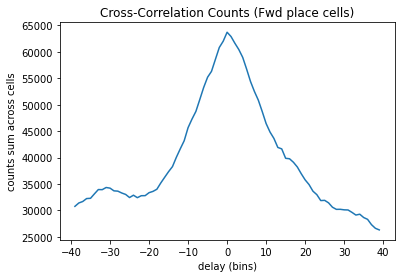

In [71]:
plt.plot(np.arange(-39,40),CCH.sum(axis=0))
plt.xlabel('delay (bins)')
plt.ylabel('counts sum across cells')
plt.title('Cross-Correlation Counts (Fwd place cells)')

In [30]:
# all
fwd = np.arange(500,spikes.shape[1])
fwd_lst = [fwd]

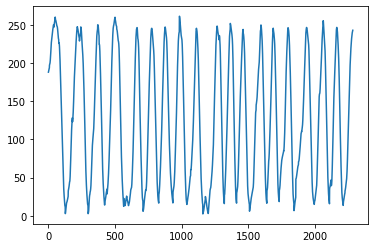

In [32]:
plt.plot(position[fwd])

In [33]:
pairs_dis, DELAYS = get_delays(place_cell,fwd_lst,spikes,field)
CCH_run = get_CCH(DELAYS)
CCH_run.shape,len(DELAYS),pairs_dis.shape

((1081, 79), 1081, (1081,))

Text(0.5, 1.0, 'Backward Place Cells Only, All Run Segments')

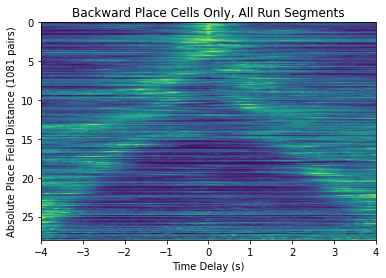

In [55]:
plot_CCH(CCH_run,pairs_dis,dis_abs=True)
plt.title('Backward Place Cells Only, All Run Segments')

In [36]:
np.save('CCH_bwdcell_allrun.npy',CCH_run)

# PBEs

In [3]:
import warnings
warnings.filterwarnings("ignore")

import nelpy as nel
import pandas as pd
import scipy.ndimage.filters
import os
import sys
import warnings
import numpy as np
import pickle
import random

import copy
import matplotlib.pyplot as plt
from scipy.io import loadmat, savemat

In [4]:
from scipy.stats import pearsonr

In [5]:
place_cell = np.load('place_cell_bwd.npz')['place_cell']
field = np.load('place_cell_bwd.npz')['field']
place_cell.shape

(47,)

In [8]:
savemat('place_cell_bwd.mat',{'place_cell':place_cell})

In [6]:
jar = nel.load_pkl('gor01vvp01pin01_processed_speed.nel')
s = '16-40-19'
exp_data = jar.exp_data[s]
aux_data = jar.aux_data[s]
del jar

In [7]:
PBEs_origin = exp_data['spikes'][aux_data['long']['PBEs'].support]
spikes = PBEs_origin.bin(ds=.004)

In [8]:
spikes.data.shape

(117, 6138)

In [9]:
def get_delays_pbebin(place_cell,spikes,field,r=40):
    DELAYS = []
    pairs_dis = []
    K = len(PBEs_origin.support.data)

    for idx1 in range(len(place_cell)):
        cell1 = place_cell[idx1]
        for idx2 in range(idx1+1, len(place_cell)):
            cell2 = place_cell[idx2]

            delays = []
            for k in range(K):
                seg = spikes[spikes.support[k]].data
                l = len(seg)
                seg_spk1 = seg[cell1,:]
                seg_spk2 = seg[cell2,:]
                
                for i in np.where(seg_spk1!=0)[0]:
                    segseg = seg_spk2[max(0,i-r):min(l,i+r)]
                    for j in np.where(segseg!=0)[0]:
                        delays.append(np.ones(seg_spk1[i]*segseg[j])*(i-j-max(0,i-r)))
                        
                        
                        
            pairs_dis.append(field[idx1]-field[idx2])
            if len(delays)>0:
                DELAYS.append(np.concatenate(delays))
            else:
                DELAYS.append(np.array([]))

    pairs_dis = np.array(pairs_dis)
    
    return pairs_dis, DELAYS

In [10]:
pairs_dis, DELAYS = get_delays_pbebin(place_cell,spikes,field)
len(DELAYS),pairs_dis.shape

(1081, (1081,))

In [8]:
def get_delays_pbe(place_cell,PBEs_origin,field):
    DELAYS = []
    pairs_dis = []
    K = len(PBEs_origin.support.data)

    for idx1 in range(len(place_cell)):
        cell1 = place_cell[idx1]
        for idx2 in range(idx1+1, len(place_cell)):
            cell2 = place_cell[idx2]

            delays = []
            for k in range(K):
                seg = PBEs_origin[PBEs_origin.support[k]].data
                seg_spk1 = seg[cell1]
                seg_spk2 = seg[cell2]
                if (len(seg_spk1)>0) & (len(seg_spk2)>0):
                    for i in seg_spk1:
                        delays.append(seg_spk2-i)
                        
            pairs_dis.append(field[idx1]-field[idx2])
            if len(delays)>0:
                DELAYS.append(np.concatenate(delays))
            else:
                DELAYS.append(np.array([]))

    pairs_dis = np.array(pairs_dis)
    
    return pairs_dis, DELAYS

In [9]:
pairs_dis, DELAYS = get_delays_pbe(place_cell,PBEs_origin,field)
len(DELAYS),pairs_dis.shape

1081

In [11]:
np.savez('delays_PBEsbin_bwd', DELAYS=DELAYS, pairs_dis=pairs_dis)

In [56]:
pairs_dis = np.load('delays_PBEs_fwd.npz',allow_pickle=True)['pairs_dis']
DELAYS = np.load('delays_PBEs_fwd.npz',allow_pickle=True)['DELAYS']
len(DELAYS),pairs_dis.shape

(630, (630,))

In [15]:
CCH_run = np.load('CCH_bwdcell_allrun.npy')
CCH_run.shape

(1081, 79)

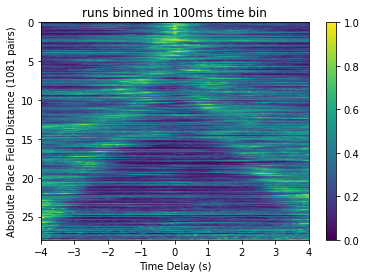

In [19]:
plot_CCH(CCH_run,pairs_dis,r=4,dis_abs=True)
plt.title('runs binned in 100ms time bin')
plt.colorbar()

In [13]:
CCH_pbe = get_CCH(DELAYS,r=40,bins=79)
CCH_pbe.shape

(1081, 79)

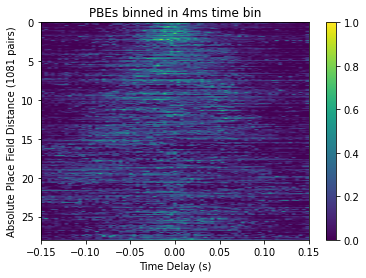

In [18]:
plot_CCH(CCH_pbe,pairs_dis,r=0.15,dis_abs=True)
plt.title('PBEs binned in 4ms time bin')
plt.colorbar()

Text(0.5, 1.0, 'Cross-Correlation Counts (Fwd place cells)')

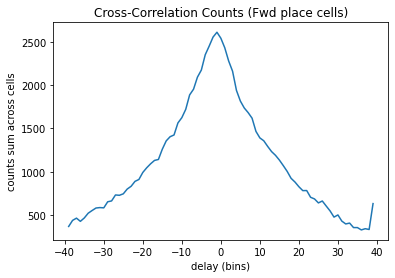

In [16]:
plt.plot(np.arange(-39,40),CCH_pbe.sum(axis=0))
plt.xlabel('delay (bins)')
plt.ylabel('counts sum across cells')
plt.title('Cross-Correlation Counts (Fwd place cells)')

## Explore time bin size

In [66]:
0.14+0.002*np.arange(20)

array([0.14 , 0.142, 0.144, 0.146, 0.148, 0.15 , 0.152, 0.154, 0.156,
       0.158, 0.16 , 0.162, 0.164, 0.166, 0.168, 0.17 , 0.172, 0.174,
       0.176, 0.178])

In [69]:
# explore time bin size
l = CCH_run.shape[0]
All_Rs = []
All_Ps = []
r_list = []
for k in range(20):
    r = 0.14+0.002*k #0.13+0.005*k
    r_list.append(r)
    CCH_pbe = get_CCH(DELAYS,r=r,bins=79)
    Rs = np.zeros(l)
    Ps = np.zeros(l)
    for i in range(l):
        Rs[i], Ps[i] = pearsonr(CCH_run[i,:],CCH_pbe[i,:])
    All_Rs.append(Rs)
    All_Ps.append(Ps)

In [71]:
RR = np.array(All_Rs)
PP = np.array(All_Ps)
RR.shape,PP.shape

((20, 630), (20, 630))

Text(0.5, 1.0, 'PBEs vs. All Run CCH (forward place cells)')

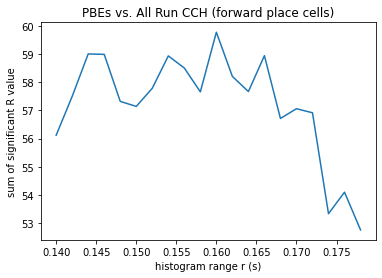

In [72]:
sig_r_val = []
for i in range(len(r_list)):
    sig_r_val.append(np.nansum(RR[i,PP[i,:]<0.05]) )

plt.plot(r_list,sig_r_val)
plt.xlabel('histogram range r (s)')
plt.ylabel('sum of significant R value')
plt.title('PBEs vs. All Run CCH (forward place cells)')

In [73]:
r_list[np.argmax(np.array(sig_r_val))]

0.16

Text(0.5, 1.0, 'Average Pearson R across cell pairs')

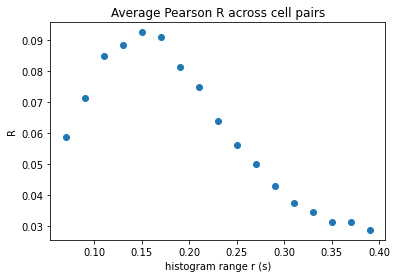

In [30]:
plt.plot(r_list,np.nanmean(RR,axis=1),'o')
plt.xlabel('histogram range r (s)')
plt.ylabel('R')
plt.title('Average Pearson R across cell pairs')

In [20]:
r_list[np.nanmean(RR,axis=1).argmax()]

0.15000000000000002

Text(0.5, 1.0, 'Average Pearson P across cell pairs')

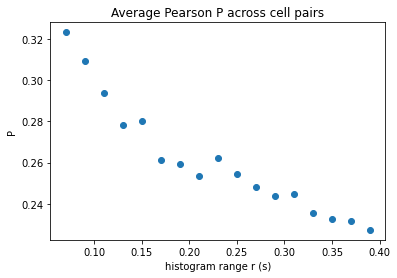

In [29]:
plt.plot(r_list,np.nanmean(PP,axis=1),'o')
plt.xlabel('histogram range r (s)')
plt.ylabel('P')
plt.title('Average Pearson P across cell pairs')

In [22]:
np.argmax(np.nanmean(RR,axis=1)),np.argmax(np.nanmean(PP,axis=1))

(4, 0)

Text(0, 0.5, 'count')

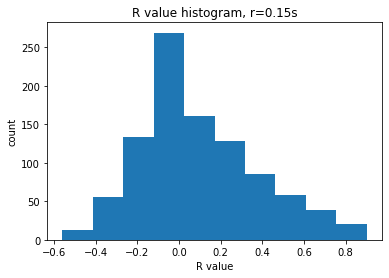

In [31]:
plt.hist(RR[4])
plt.title('R value histogram, r=0.15s')
plt.xlabel('R value')
plt.ylabel('count')

Text(0, 0.5, 'count')

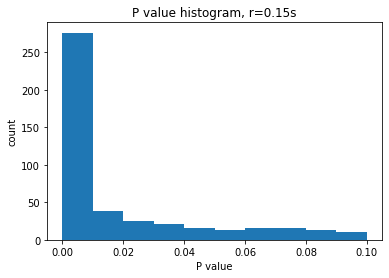

In [33]:
plt.hist(PP[4],range=(0,0.1))
plt.title('P value histogram, r=0.15s')
plt.xlabel('P value')
plt.ylabel('count')

Text(0.5, 1.0, 'Forward Place Cells Only, All PBEs Segments')

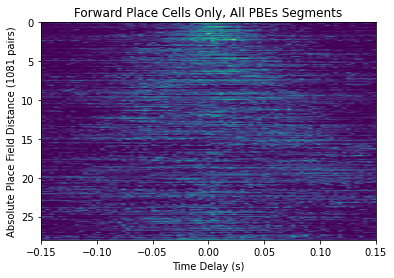

In [25]:
CCH = get_CCH(DELAYS,r=r_list[4],bins=79)
plot_CCH(CCH, pairs_dis, r=r_list[4], dis_abs=True)
plt.title('Forward Place Cells Only, All PBEs Segments')

## Explore firing rate scaling

In [ ]:
def plot_CCH(CCH,pairs_dis,r=4,dis_abs=False):
    CCH_n = CCH/CCH.max(axis=1)[:,np.newaxis]
    CCH_n[CCH.max(axis=1)==0,:] = np.zeros_like(CCH[0,:])
    if dis_abs:
        order_pair = np.argsort(np.abs(pairs_dis))
    else:
        order_pair = np.argsort(pairs_dis)
    plt.imshow(CCH_n[order_pair,:],aspect='auto',extent=(-r,r,pairs_dis[order_pair[-1]],pairs_dis[order_pair[0]]))
    plt.xlabel('Time Delay (s)')
    if dis_abs:
        plt.ylabel(f'Absolute Place Field Distance ({CCH.shape[0]} pairs)')
    else:
        plt.ylabel(f'Place Field Distance ({CCH.shape[0]} pairs)')
    pass

In [39]:
np.sum(CCH_run)/np.sum(CCH_pbe)

140.64906336276724

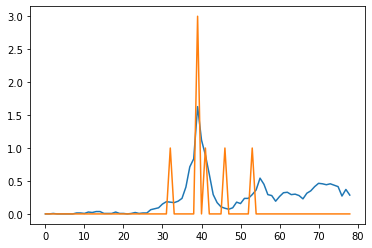

In [46]:
i = 15
plt.plot(CCH_run[i,:]/140)
plt.plot(CCH_pbe[i,:])

In [52]:
np.linalg.norm((CCH_run-CCH_pbe).flatten())

111401.64897792133

In [54]:
np.linalg.norm((CCH_run/10-CCH_pbe).flatten())

10774.955495499737

In [55]:
l = CCH_run.shape[0]
distance = []
r_list = []
for k in range(1,20):
    r = 20*k #0.13+0.005*k
    r_list.append(r)
    distance.append(np.linalg.norm((CCH_run/r-CCH_pbe).flatten()))

In [42]:
RR = np.array(All_Rs)
PP = np.array(All_Ps)
RR.shape,PP.shape

((19, 1081), (19, 1081))

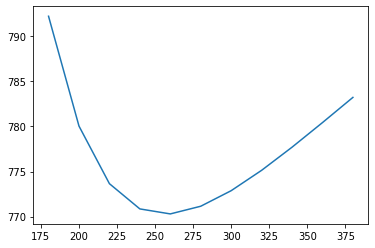

In [61]:
plt.plot(r_list[8:19],distance[8:19])

In [59]:
r_list[np.argmin(distance)],np.argmin(distance)

(260, 12)

In [58]:
r_list[-1]

380